In [1]:
import collections
collections.Iterable = collections.abc.Iterable
from prepare_model_env import *

In [2]:
%env SM_FRAMEWORK=tf.keras

env: SM_FRAMEWORK=tf.keras


In [3]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import keras

In [4]:
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [5]:
BACKBONE = 'efficientnetb4'
BATCH_SIZE = 8
EPOCHS = 15

preprocess_input = sm.get_preprocessing(BACKBONE)

In [6]:
# define network parameters
n_classes = 1
activation = 'sigmoid'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

In [7]:
# dice loss = 1 - (2 * intersection) / (union + intersection)
dice_loss = sm.losses.DiceLoss()
# Binary Focal Loss = -α * (1 - p)^γ * log(p) - (1 - α) * p^γ * log(1 - p)
# α is a weighting factor to balance the contribution of the two classes. It is typically set to the inverse of the class frequencies.
# p is the predicted probability of the positive class.
# γ is the focusing parameter that controls how much the loss is focused on hard examples.
# When γ = 0, the focal loss becomes the standard binary cross-entropy loss. As γ increases,
# the loss focuses more on hard examples, i.e., examples that are misclassified with high confidence.
focal_loss = sm.losses.BinaryFocalLoss(gamma=3.5, alpha=0.3)

total_loss = dice_loss + 1.5*focal_loss

metrics = [sm.metrics.IOUScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optimizer='Adam', loss=total_loss, metrics=metrics)

In [8]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 stem_conv (Conv2D)             (None, None, None,   1296        ['input_1[0][0]']                
                                48)                                                               
                                                                                                  
 stem_bn (BatchNormalization)   (None, None, None,   192         ['stem_conv[0][0]']              
                                48)                                                           

In [19]:
# load dataset
dataset = Dataset(dataset_dir="../../datasets/marine_debris_detection/marine_debris-semantic_segmentation/dataset/", augmentation=get_training_augmentation())

D:\anaconda\envs\segmentation_gpu\lib\site-packages\albumentations\augmentations\transforms.py:2029: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  warnings.warn('Using lambda is incompatible with multiprocessing. '


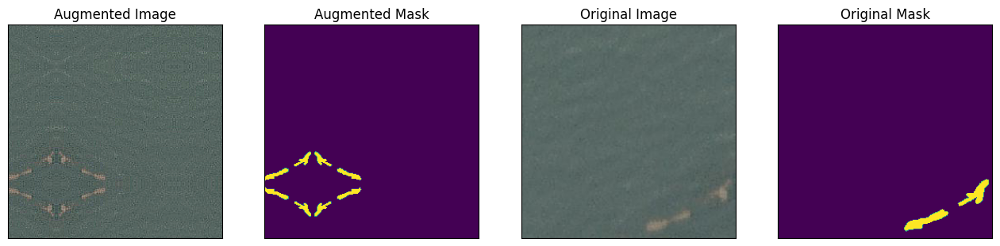

In [20]:
image, mask = dataset[120] # get some sample
visualize(
    augmented_image=image,
    augmented_mask=mask,
    original_image= dataset.x[120],
    original_mask= dataset.y[120]
)

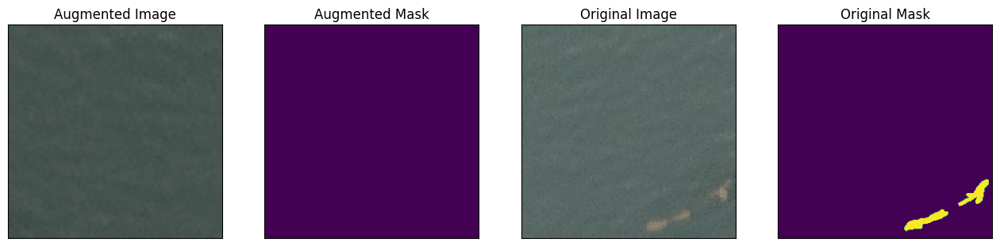

In [11]:
image, mask = dataset[120] # get some sample
visualize(
    augmented_image=image,
    augmented_mask=mask,
    original_image= dataset.x[120],
    original_mask= dataset.y[120]
)

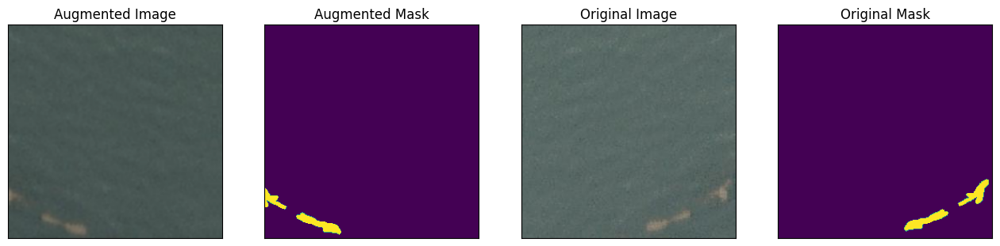

In [12]:
image, mask = dataset[120] # get some sample
visualize(
    augmented_image=image,
    augmented_mask=mask,
    original_image= dataset.x[120],
    original_mask= dataset.y[120]
)

In [21]:
# train test split
x_train, x_val, y_train, y_val = dataset.split_data()

# pre processing
x_train, y_train, x_val, y_val = dataset.pre_process(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)

# define dataloader and datasets objects for train and validation data
train_dataset = Dataset(
    x=x_train,
    y=y_train,
    augmentation=get_training_augmentation()
)

valid_dataset = Dataset(
    x=x_val,
    y=y_val,
    augmentation=get_training_augmentation()
)

In [22]:
train_dataloader = Dataloader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, generate=15)
valid_dataloader = Dataloader(valid_dataset, batch_size=1, shuffle=False, generate=10)

In [15]:
# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model_efficientnetb4_1.h5', save_weights_only=True, save_best_only=True, mode='min', monitor="val_loss"),
    keras.callbacks.ReduceLROnPlateau(),
]

In [16]:
tf.config.run_functions_eagerly(True)

In [17]:
history = model.fit(
    x=train_dataloader.dataset.x,
    y=train_dataloader.dataset.y,
    shuffle=train_dataloader.shuffle,
    batch_size=train_dataloader.batch_size,
    callbacks=callbacks,
    epochs=EPOCHS,
    validation_data=(valid_dataloader.dataset.x, valid_dataloader.dataset.y),
)

Epoch 1/15


D:\anaconda\envs\segmentation_run\lib\site-packages\tensorflow\python\data\ops\structured_function.py:254: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


300/300 [==============================] - 1906s 6s/step - loss: 0.3685 - iou_score: 0.5701 - val_loss: 0.4417 - val_iou_score: 0.4431 - lr: 0.0010
Epoch 2/15
300/300 [==============================] - 1894s 6s/step - loss: 0.1921 - iou_score: 0.7094 - val_loss: 0.3129 - val_iou_score: 0.5748 - lr: 0.0010
Epoch 3/15
300/300 [==============================] - 1894s 6s/step - loss: 0.1619 - iou_score: 0.7489 - val_loss: 0.2979 - val_iou_score: 0.5878 - lr: 0.0010
Epoch 4/15
300/300 [==============================] - 1894s 6s/step - loss: 0.1338 - iou_score: 0.7873 - val_loss: 0.3595 - val_iou_score: 0.5247 - lr: 0.0010
Epoch 5/15
300/300 [==============================] - 1892s 6s/step - loss: 0.1280 - iou_score: 0.7958 - val_loss: 0.4224 - val_iou_score: 0.4719 - lr: 0.0010
Epoch 6/15
300/300 [==============================] - 1885s 6s/step - loss: 0.1117 - iou_score: 0.8191 - val_loss: 0.4014 - val_iou_score: 0.4912 - lr: 0.0010
Epoch 7/15
300/300 [==============================] - 188

In [8]:
model.load_weights("best_model_efficientnetb4_1.h5")

1/1 [==============================] - 0s 50ms/step


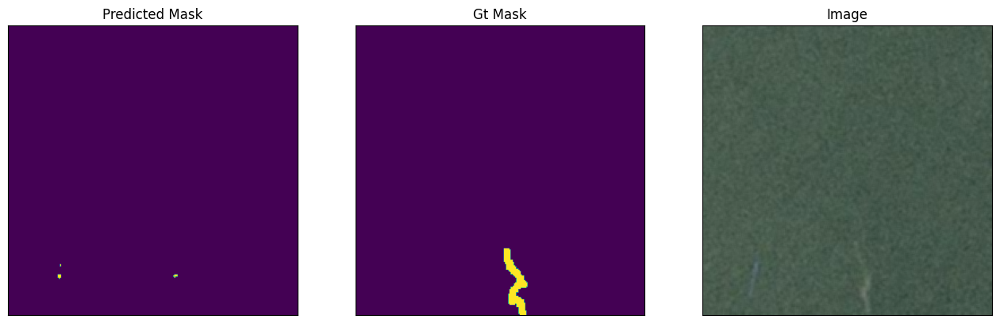

1/1 [==============================] - 0s 43ms/step


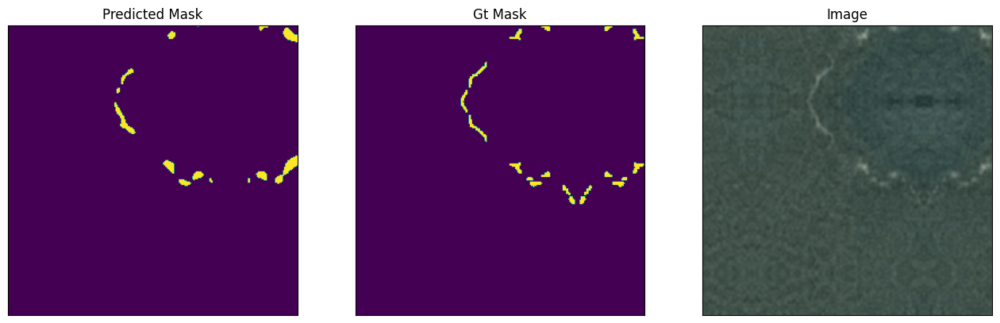

1/1 [==============================] - 0s 48ms/step


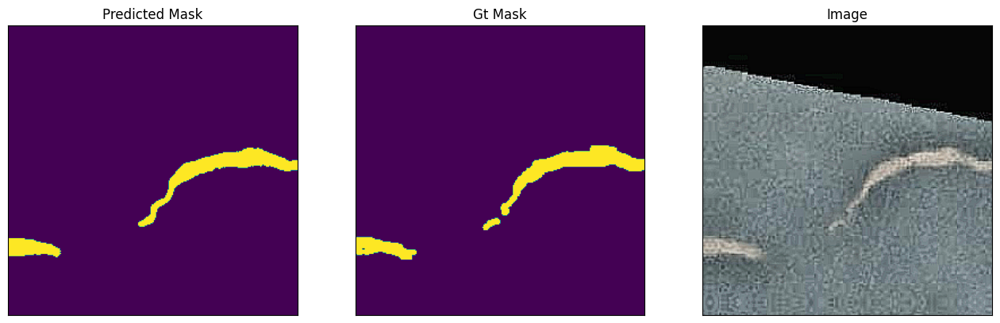

1/1 [==============================] - 0s 48ms/step


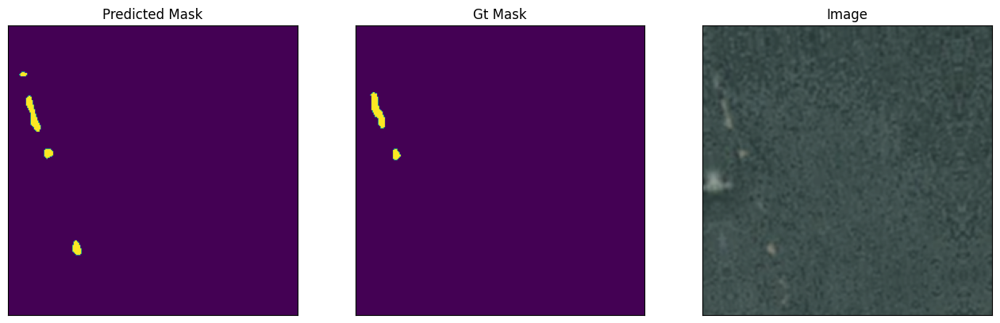

1/1 [==============================] - 0s 45ms/step


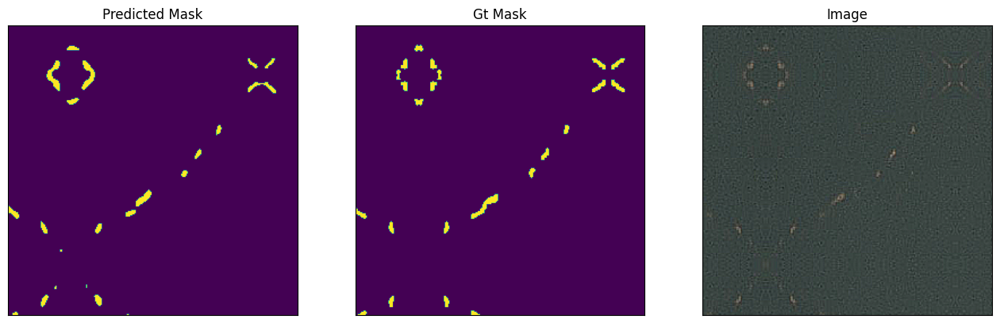

1/1 [==============================] - 0s 41ms/step


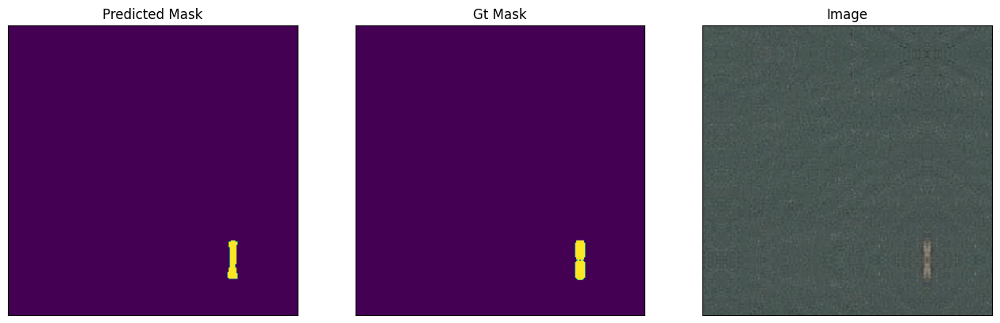

1/1 [==============================] - 0s 44ms/step


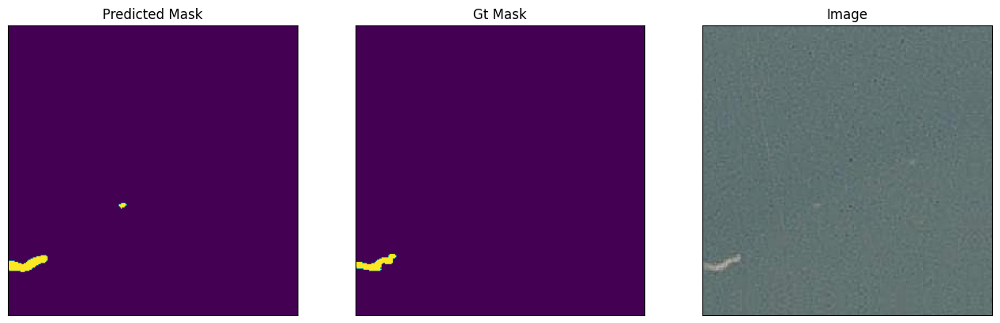

1/1 [==============================] - 0s 48ms/step


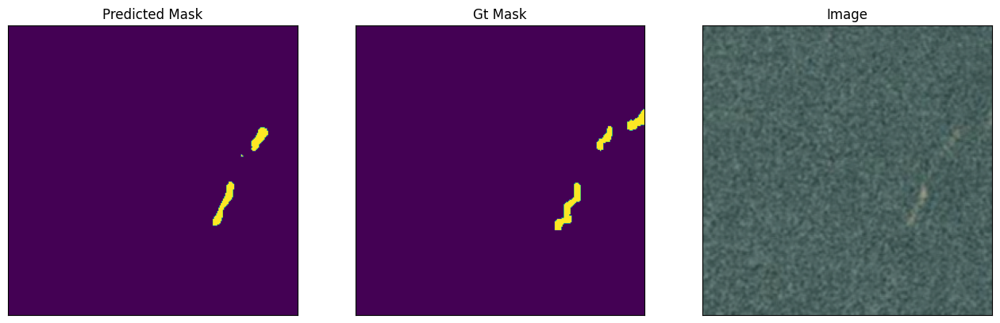

1/1 [==============================] - 0s 50ms/step


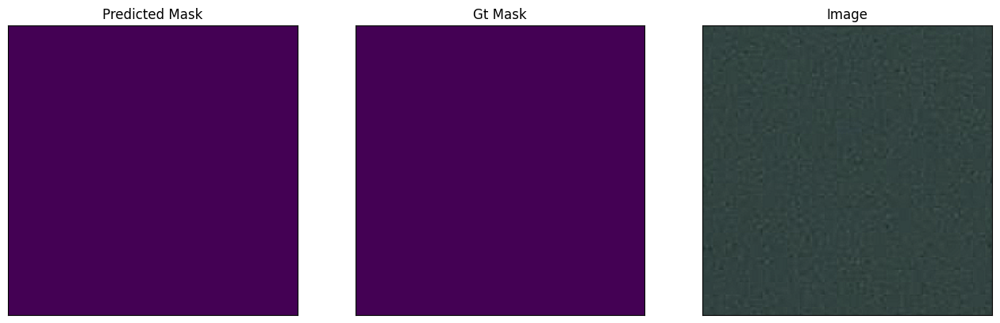

1/1 [==============================] - 0s 40ms/step


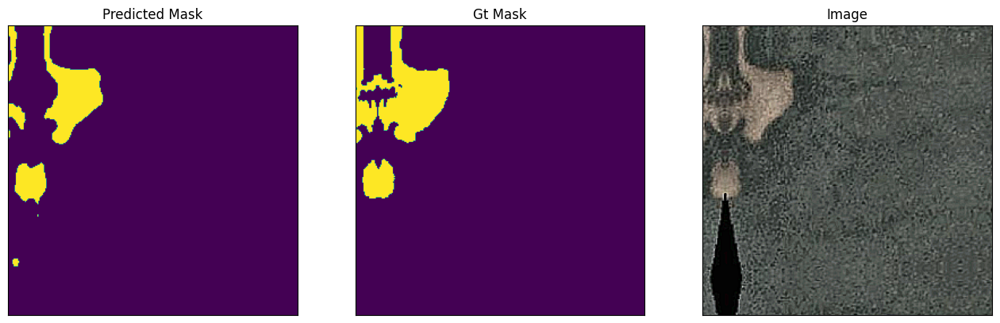

1/1 [==============================] - 0s 38ms/step


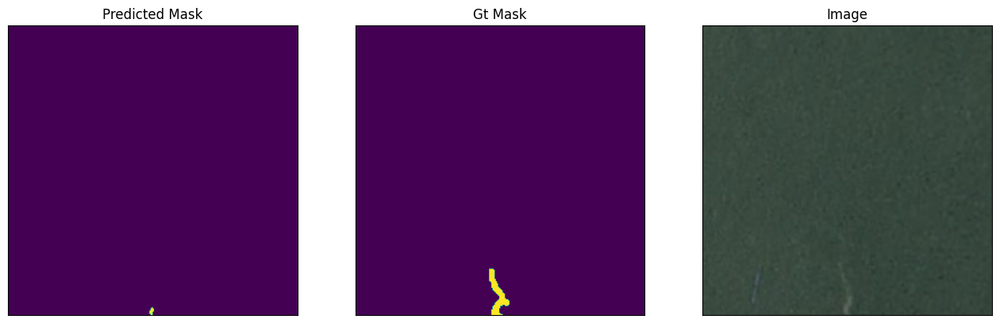

1/1 [==============================] - 0s 41ms/step


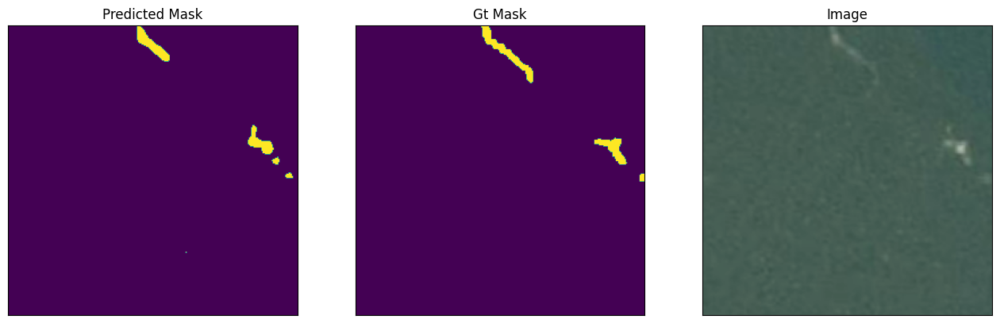

1/1 [==============================] - 0s 43ms/step


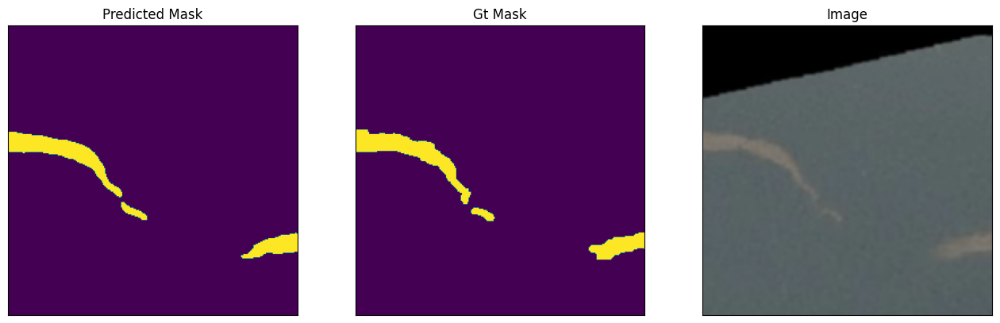

1/1 [==============================] - 0s 42ms/step


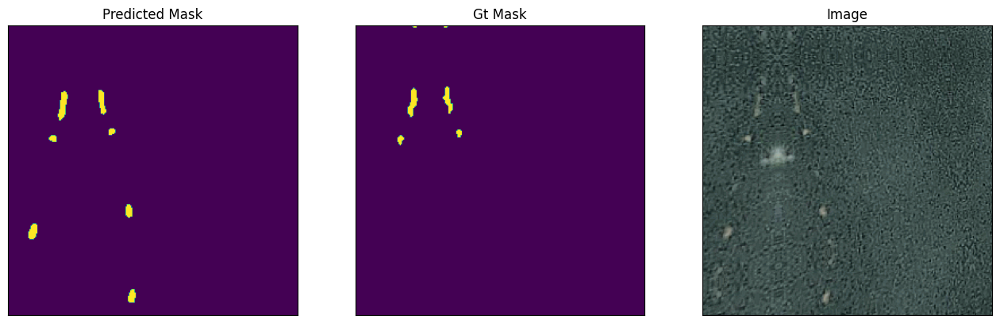

1/1 [==============================] - 0s 46ms/step


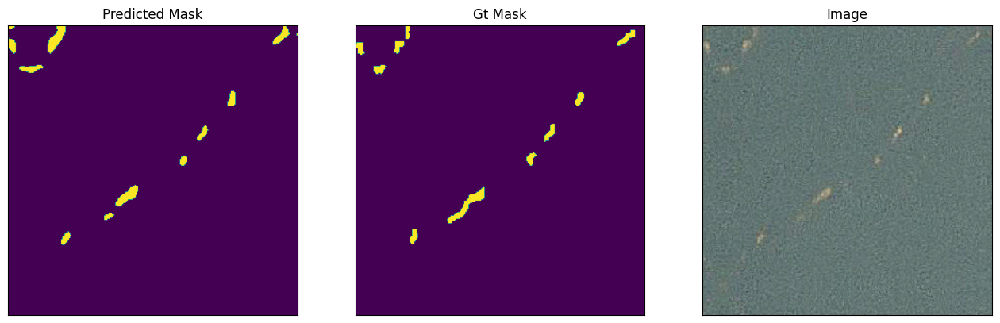

1/1 [==============================] - 0s 38ms/step


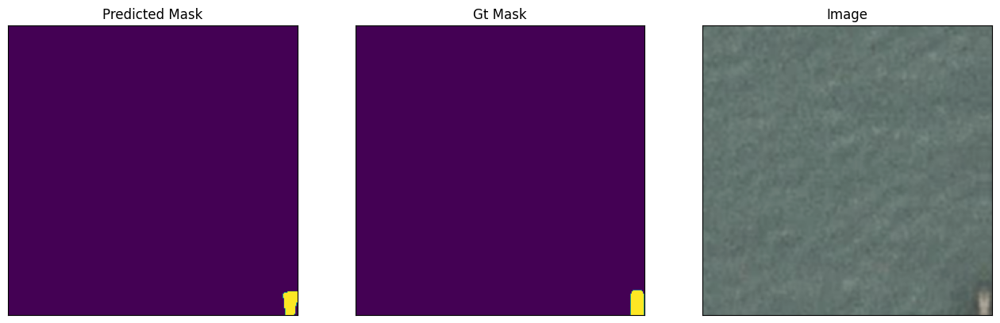

1/1 [==============================] - 0s 39ms/step


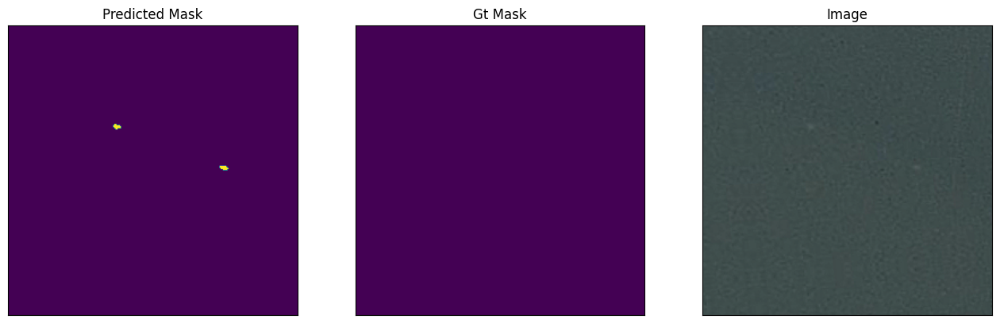

1/1 [==============================] - 0s 41ms/step


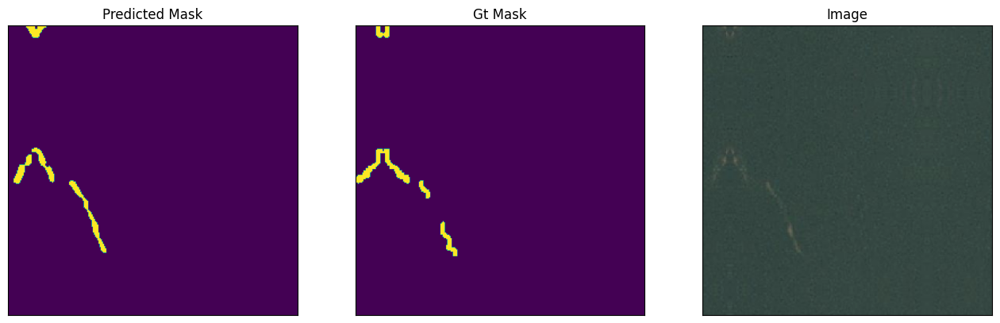

1/1 [==============================] - 0s 40ms/step


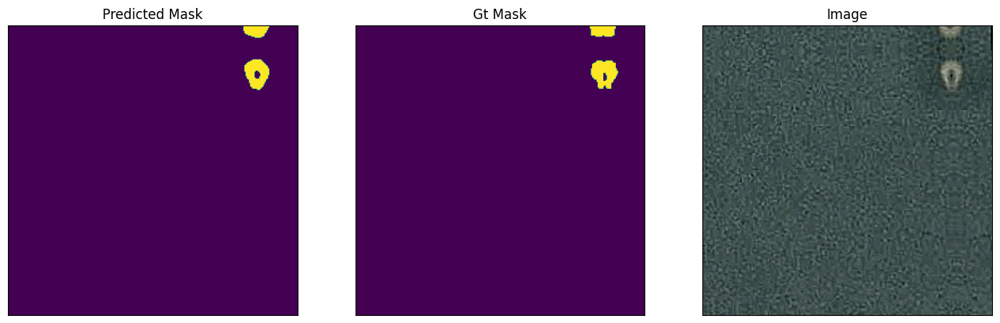

1/1 [==============================] - 0s 51ms/step


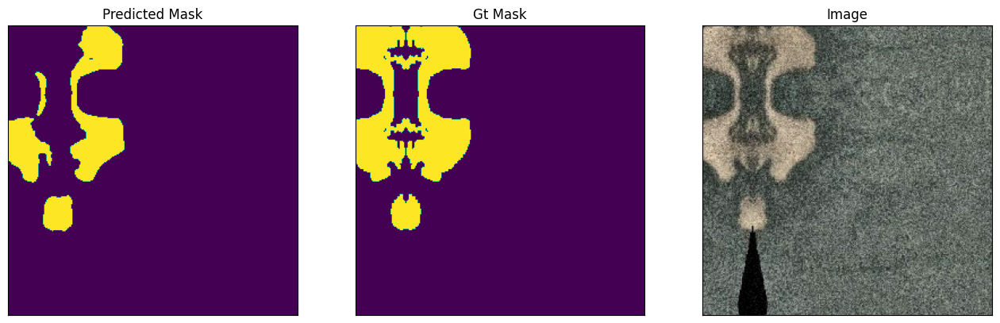

1/1 [==============================] - 0s 43ms/step


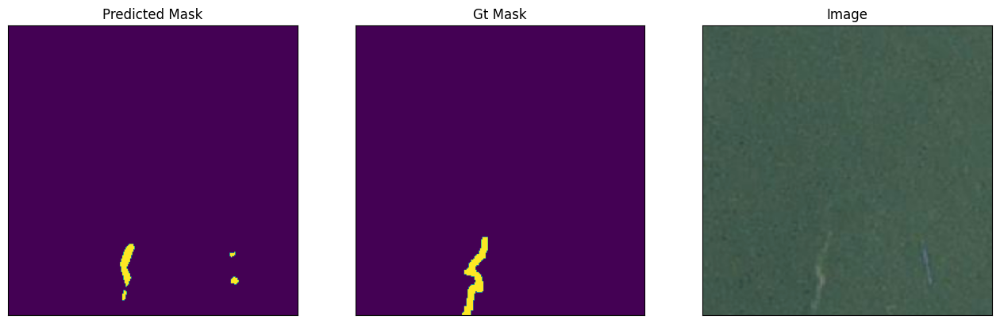

1/1 [==============================] - 0s 43ms/step


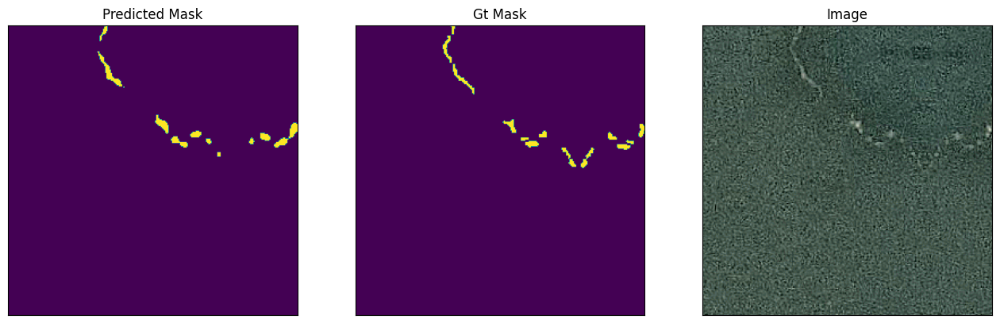

1/1 [==============================] - 0s 37ms/step


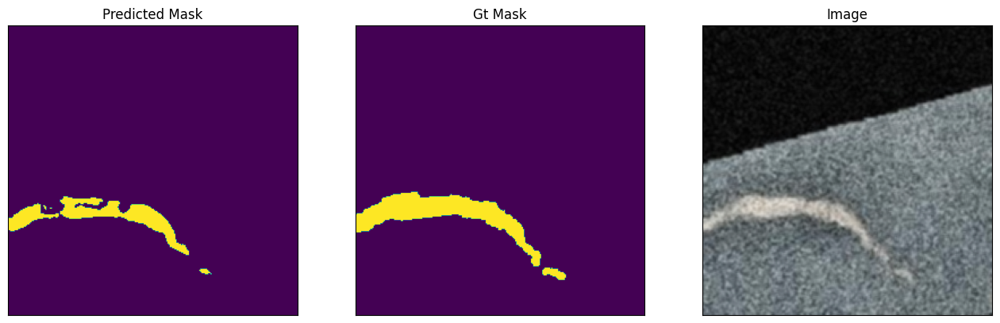

1/1 [==============================] - 0s 45ms/step


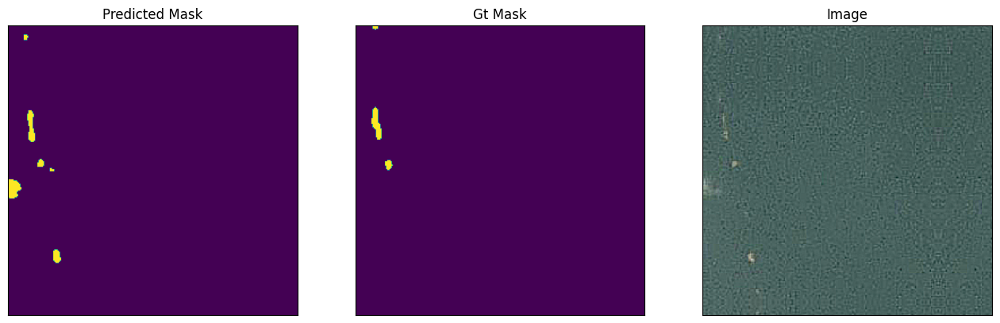

1/1 [==============================] - 0s 40ms/step


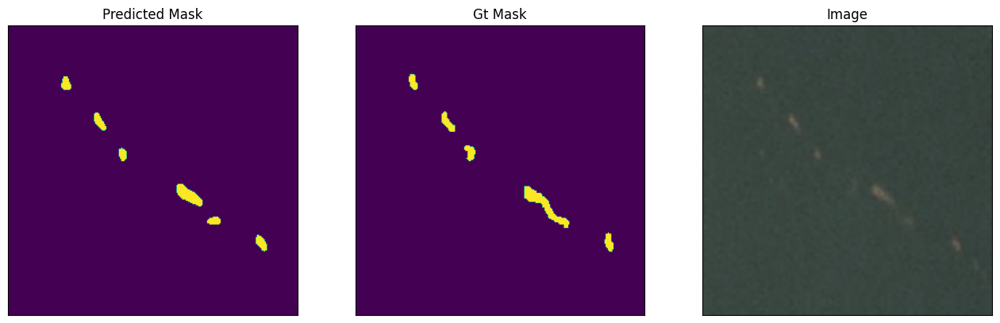

1/1 [==============================] - 0s 39ms/step


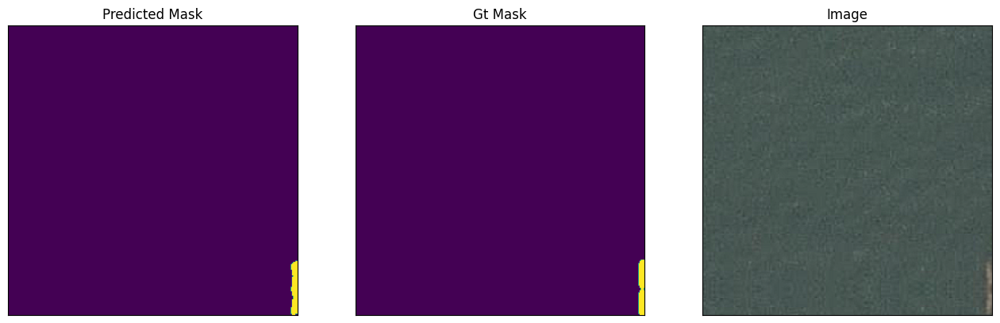

1/1 [==============================] - 0s 44ms/step


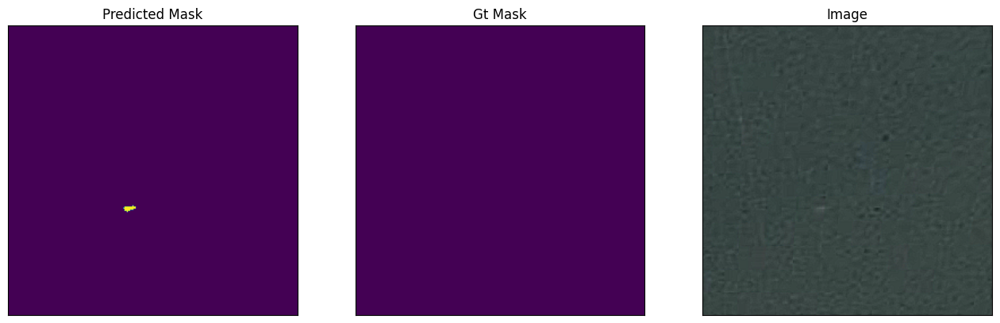

1/1 [==============================] - 0s 40ms/step


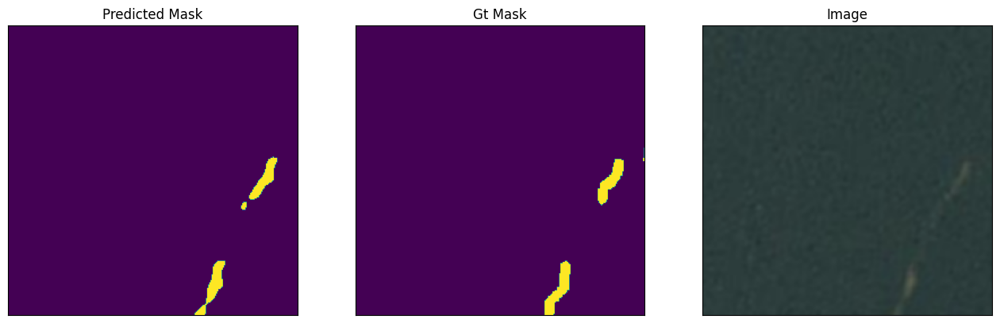

1/1 [==============================] - 0s 45ms/step


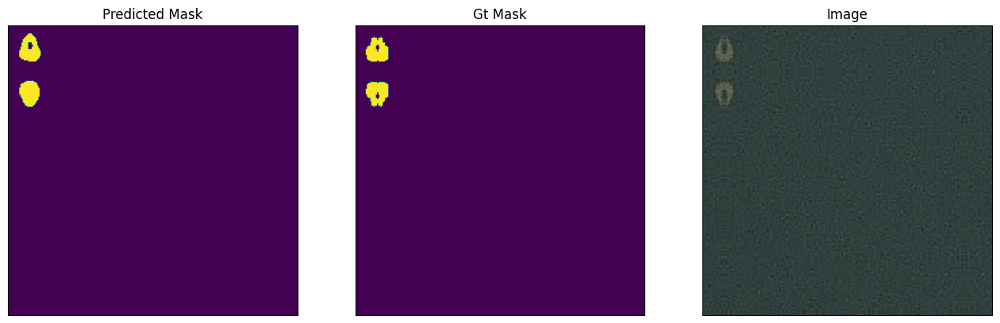

1/1 [==============================] - 0s 40ms/step


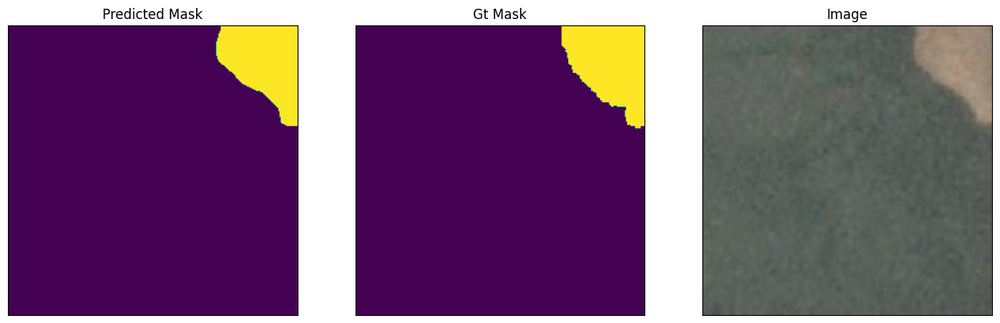

1/1 [==============================] - 0s 43ms/step


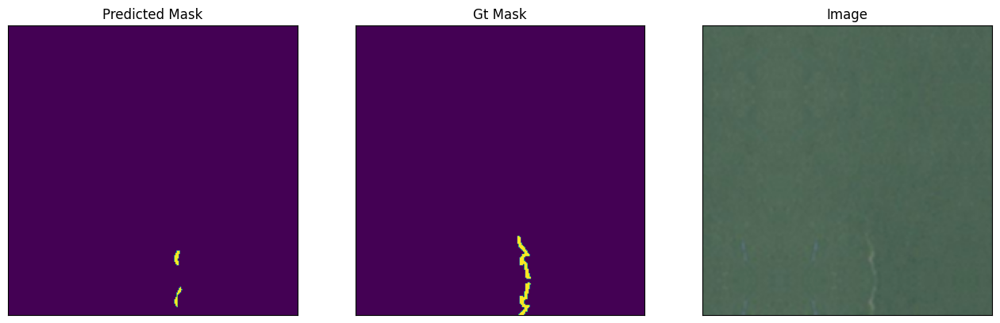

1/1 [==============================] - 0s 40ms/step


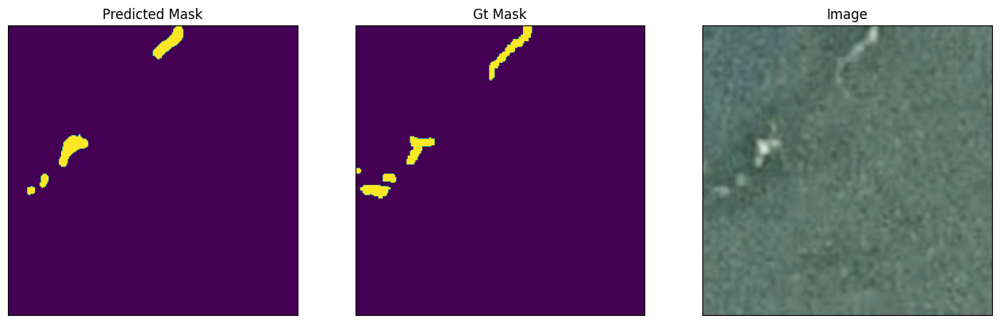

1/1 [==============================] - 0s 43ms/step


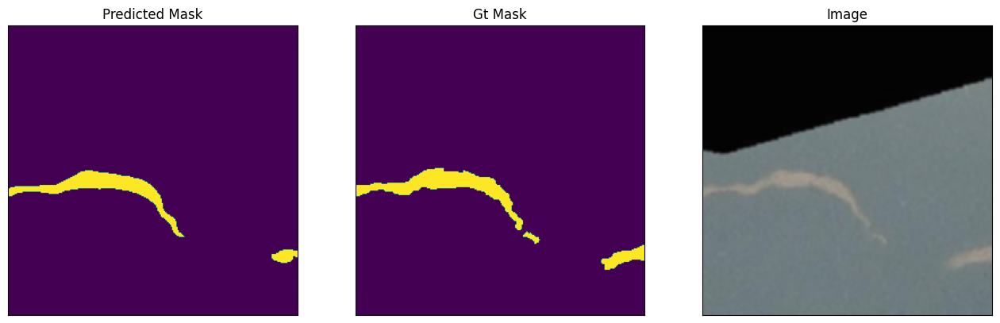

1/1 [==============================] - 0s 41ms/step


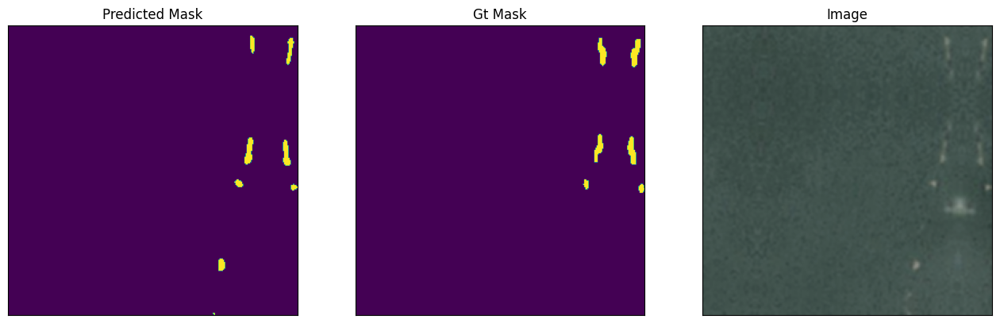

1/1 [==============================] - 0s 45ms/step


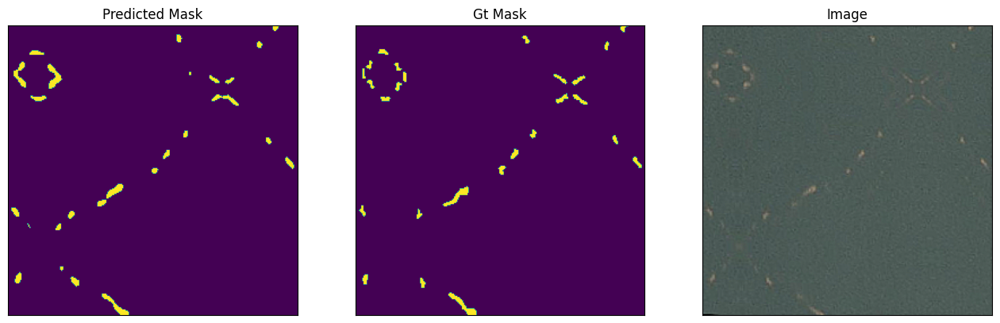

1/1 [==============================] - 0s 41ms/step


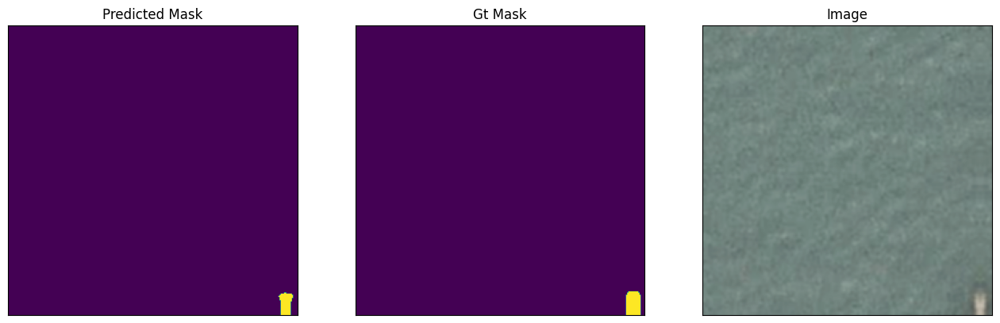

1/1 [==============================] - 0s 42ms/step


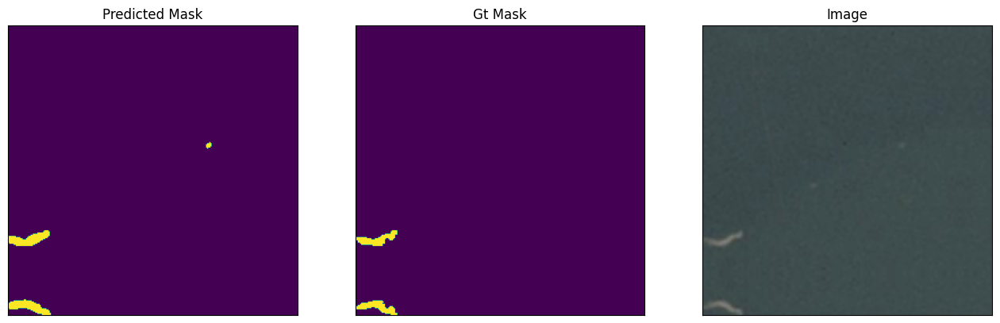

1/1 [==============================] - 0s 43ms/step


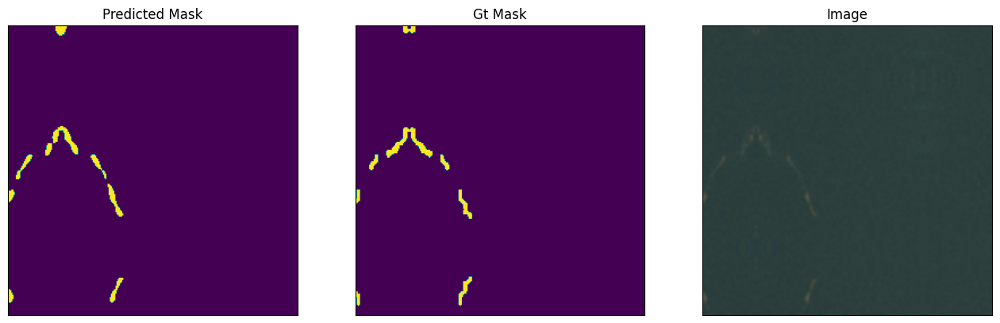

1/1 [==============================] - 0s 43ms/step


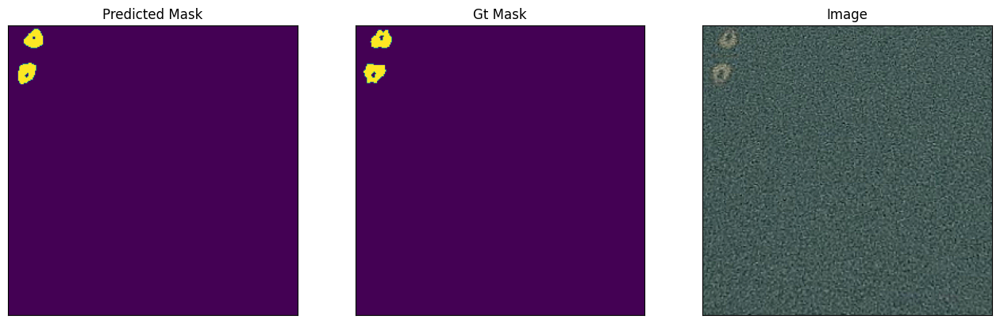

1/1 [==============================] - 0s 42ms/step


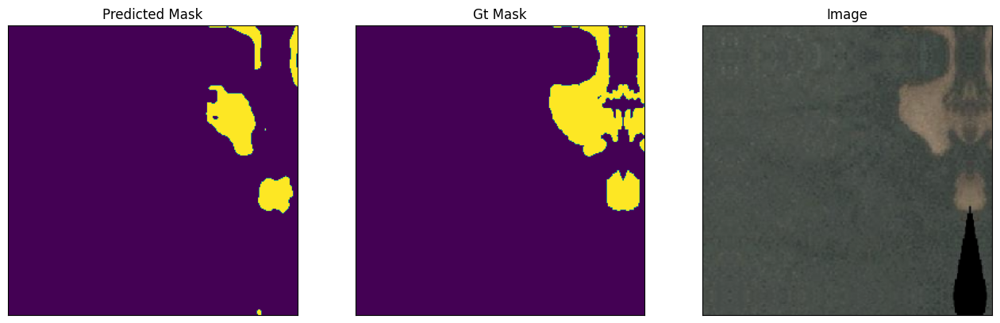

In [23]:
with tf.device('/GPU:0'):
    # checking few predictions from the valid dataset
    for i in range(300, 340):
      prediction = predict(model, valid_dataloader.dataset.x[i])
      visualize(
          predicted_mask=prediction,
          gt_mask=valid_dataloader.dataset.y[i],
          image=valid_dataloader.dataset.x[i]
      )

1/1 [==============================] - 0s 58ms/step


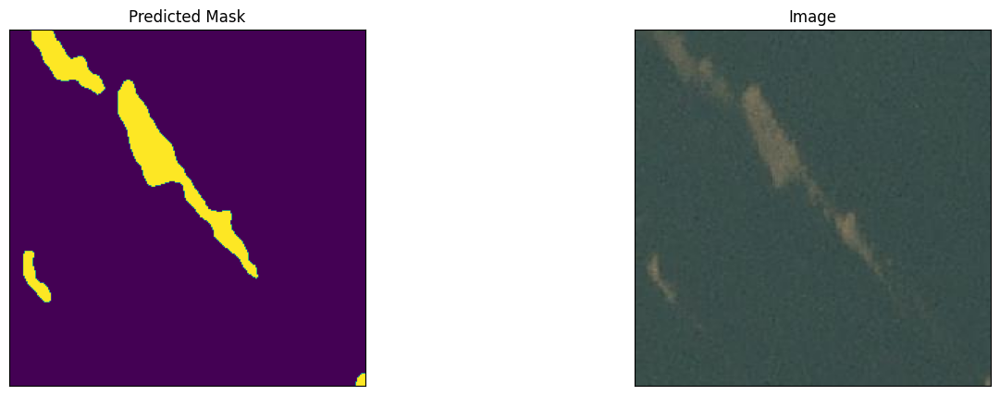

1/1 [==============================] - 0s 48ms/step


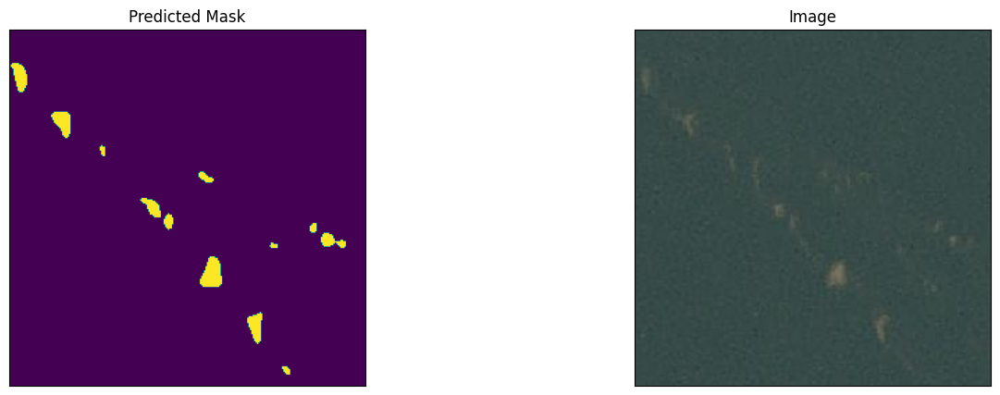

1/1 [==============================] - 0s 43ms/step


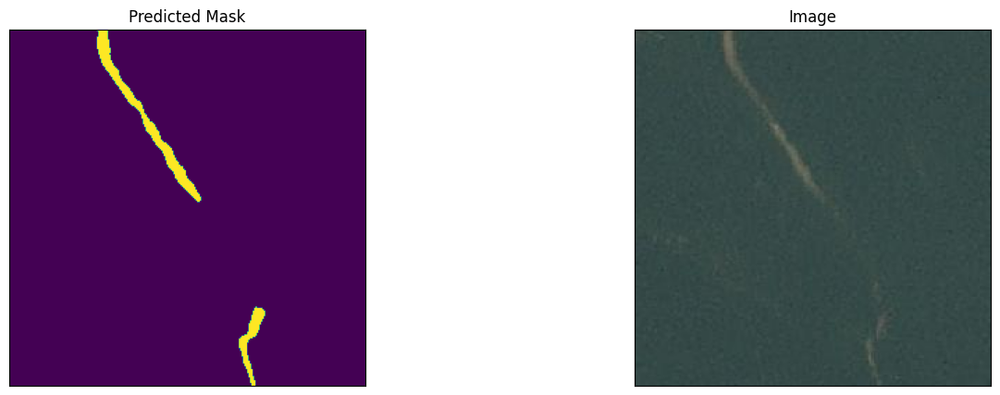

1/1 [==============================] - 0s 44ms/step


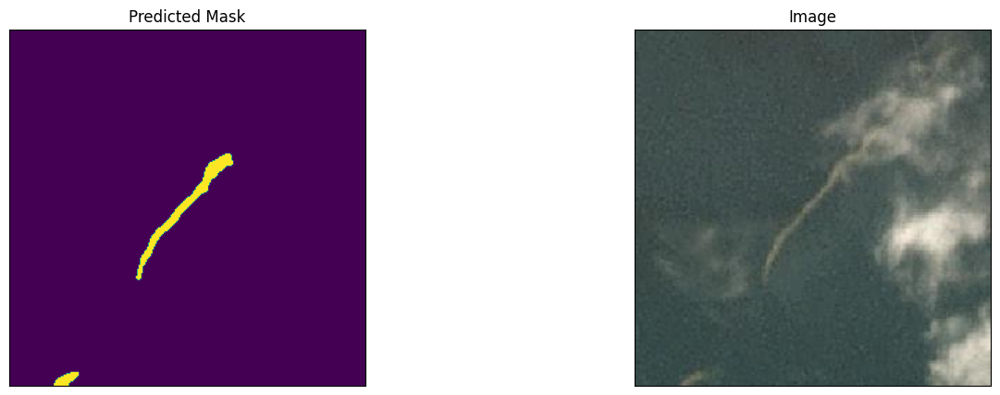

1/1 [==============================] - 0s 41ms/step


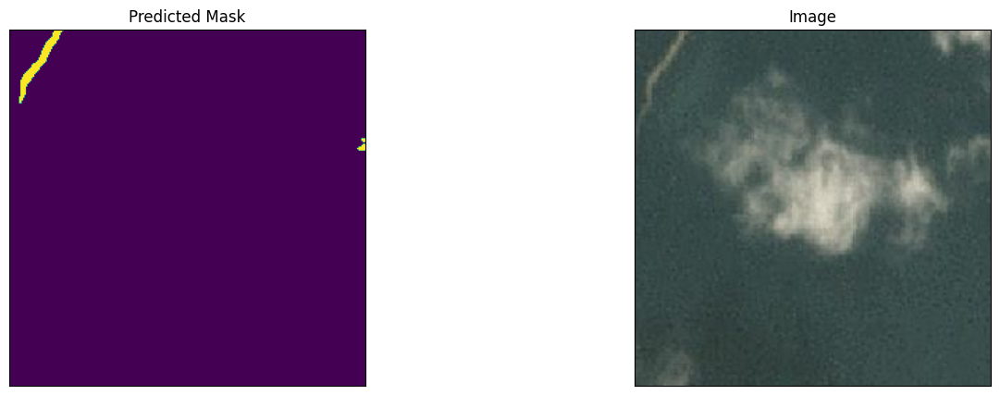

1/1 [==============================] - 0s 42ms/step


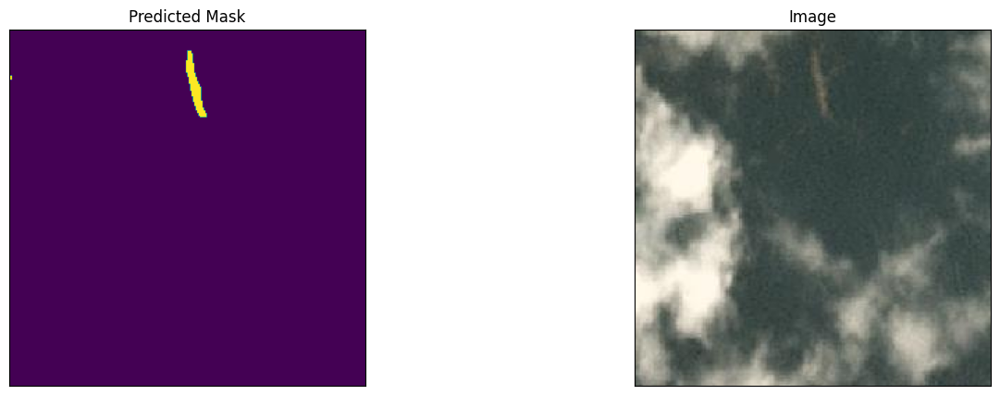

1/1 [==============================] - 0s 42ms/step


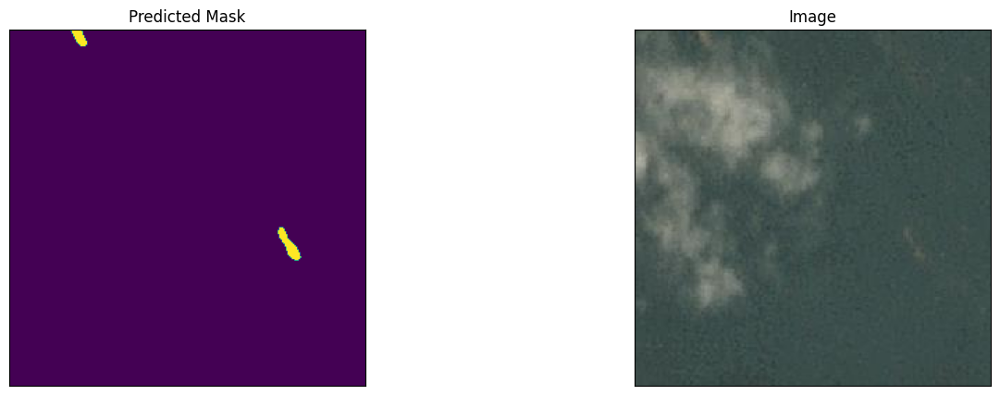

1/1 [==============================] - 0s 42ms/step


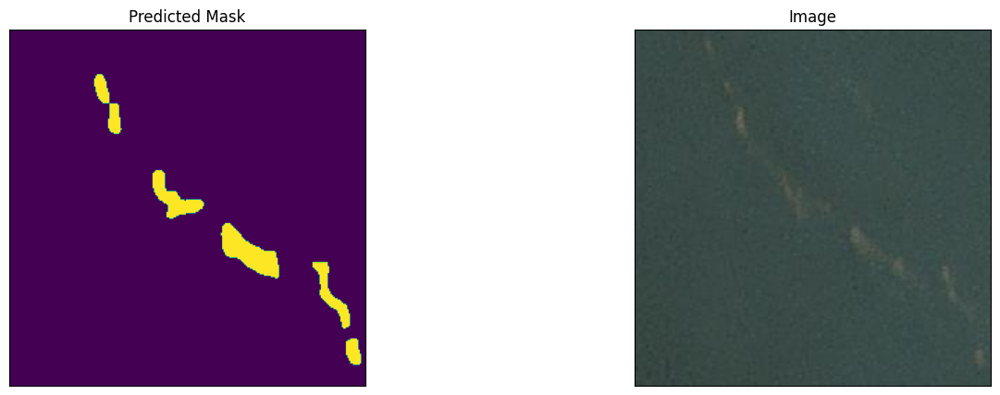

1/1 [==============================] - 0s 46ms/step


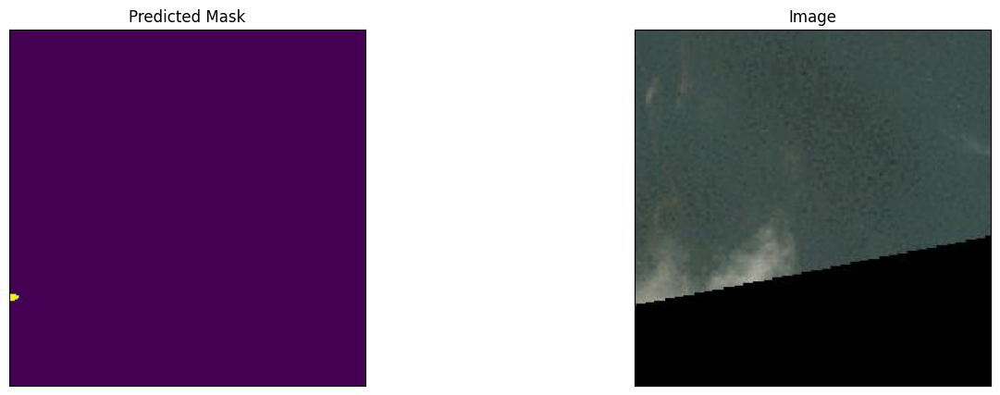

1/1 [==============================] - 0s 48ms/step


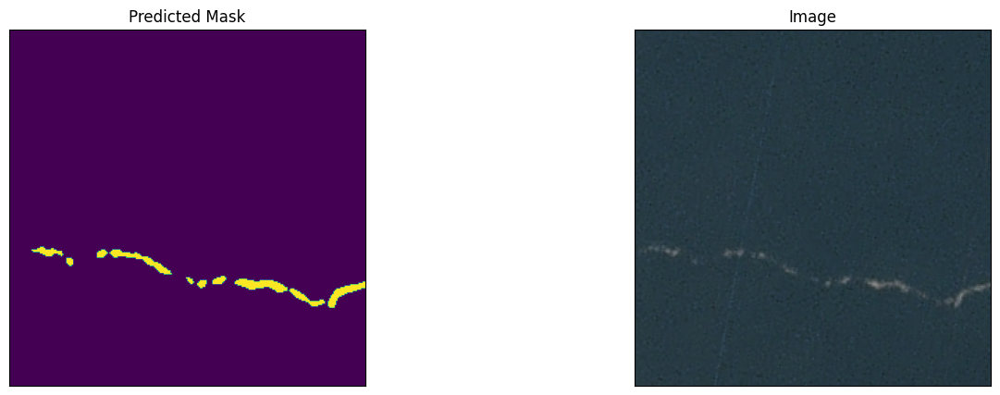

In [18]:
with tf.device("/GPU:0"):
    ## checking predictions on new unannotated images
    dataset_dir = "../../datasets/marine_debris_detection/marine_debris-semantic_segmentation/test/unannotated_images/"
    test_images = []
    for filename in os.listdir(dataset_dir):
        image_path = os.path.join(dataset_dir, filename)
        test_images.append(io.imread(image_path))

    for test_image in test_images:
        prediction = predict(model=model, image=test_image)
        visualize(
          predicted_mask=prediction,
          image=test_image
        )

In [16]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [11]:
tf.debugging.set_log_device_placement(True)

In [17]:
with tf.device("/GPU:0"):
    a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')
    b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')
    c = tf.matmul(a, b)

# print the result
print(c)

tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)
